In [1]:
import plotly.graph_objs as go
import plotly.io as pio
import plotly.express as px
import pandas as pd
import matplotlib.pyplot as plt
import plotly.offline as py
py.init_notebook_mode(connected=True)
pio.renderers.default='colab'

In [2]:
ds1=pd.read_csv("C:\\Users\\Srinivas\\Downloads\\covid.csv")

In [3]:
ds1.head()

,Country/Region,Continent,Population,TotalCases,NewCases,TotalDeaths,NewDeaths,TotalRecovered,NewRecovered,ActiveCases,"Serious,Critical",Tot Cases/1M pop,Deaths/1M pop,TotalTests,Tests/1M pop,WHO Region,iso_alpha
0,USA,North America,3.311981e+08,5032179,NaN,162804.0,NaN,2576668.0,NaN,2292707.0,18296.0,15194.0,492.0,63139605.0,190640.0,Americas,USA
1,Brazil,South America,2.127107e+08,2917562,NaN,98644.0,NaN,2047660.0,NaN,771258.0,8318.0,13716.0,464.0,13206188.0,62085.0,Americas,BRA
2,India,Asia,1.381345e+09,2025409,NaN,41638.0,NaN,1377384.0,NaN,606387.0,8944.0,1466.0,30.0,22149351.0,16035.0,South-EastAsia,IND
3,Russia,Europe,1.459409e+08,871894,NaN,14606.0,NaN,676357.0,NaN,180931.0,2300.0,5974.0,100.0,29716907.0,203623.0,Europe,RUS
4,South Africa,Africa,5.938157e+07,538184,NaN,9604.0,NaN,387316.0,NaN,141264.0,539.0,9063.0,162.0,3149807.0,53044.0,Africa,ZAF


In [4]:
print(ds1.shape)

(209, 17)


In [5]:
print(ds1.size)

3553


In [6]:
ds1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209 entries, 0 to 208
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Country/Region    209 non-null    object 
 1   Continent         208 non-null    object 
 2   Population        208 non-null    float64
 3   TotalCases        209 non-null    int64  
 4   NewCases          4 non-null      float64
 5   TotalDeaths       188 non-null    float64
 6   NewDeaths         3 non-null      float64
 7   TotalRecovered    205 non-null    float64
 8   NewRecovered      3 non-null      float64
 9   ActiveCases       205 non-null    float64
 10  Serious,Critical  122 non-null    float64
 11  Tot Cases/1M pop  208 non-null    float64
 12  Deaths/1M pop     187 non-null    float64
 13  TotalTests        191 non-null    float64
 14  Tests/1M pop      191 non-null    float64
 15  WHO Region        184 non-null    object 
 16  iso_alpha         209 non-null    object 
dt

In [7]:
ds2=pd.read_csv("C:\\Users\\Srinivas\\Downloads\\covid_grouped.csv")

In [8]:
ds2.head()

,Date,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,WHO Region,iso_alpha
0,2020-01-22,Afghanistan,0,0,0,0,0,0,0,Eastern Mediterranean,AFG
1,2020-01-22,Albania,0,0,0,0,0,0,0,Europe,ALB
2,2020-01-22,Algeria,0,0,0,0,0,0,0,Africa,DZA
3,2020-01-22,Andorra,0,0,0,0,0,0,0,Europe,AND
4,2020-01-22,Angola,0,0,0,0,0,0,0,Africa,AGO


In [9]:
print(ds2.shape)
print(ds2.size)

(35156, 11)
386716


In [10]:
ds2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35156 entries, 0 to 35155
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Date            35156 non-null  object
 1   Country/Region  35156 non-null  object
 2   Confirmed       35156 non-null  int64 
 3   Deaths          35156 non-null  int64 
 4   Recovered       35156 non-null  int64 
 5   Active          35156 non-null  int64 
 6   New cases       35156 non-null  int64 
 7   New deaths      35156 non-null  int64 
 8   New recovered   35156 non-null  int64 
 9   WHO Region      35156 non-null  object
 10  iso_alpha       35156 non-null  object
dtypes: int64(7), object(4)
memory usage: 3.0+ MB


In [11]:
ds1.columns

Index(['Country/Region', 'Continent', 'Population', 'TotalCases', 'NewCases',
       'TotalDeaths', 'NewDeaths', 'TotalRecovered', 'NewRecovered',
       'ActiveCases', 'Serious,Critical', 'Tot Cases/1M pop', 'Deaths/1M pop',
       'TotalTests', 'Tests/1M pop', 'WHO Region', 'iso_alpha'],
      dtype='object')

DATA CLEANING

In [12]:
ds1.drop(['NewCases','NewDeaths','NewRecovered'],axis=1,inplace=True)

In [13]:
ds1.sample(5)

,Country/Region,Continent,Population,TotalCases,TotalDeaths,TotalRecovered,ActiveCases,"Serious,Critical",Tot Cases/1M pop,Deaths/1M pop,TotalTests,Tests/1M pop,WHO Region,iso_alpha
42,Guatemala,North America,17946899.0,54339,2119.0,42070.0,10150.0,5.0,3028.0,118.0,172712.0,9624.0,Americas,GTM
29,Sweden,Europe,10105596.0,81967,5766.0,NaN,NaN,38.0,8111.0,571.0,863315.0,85429.0,Europe,SWE
98,Greece,Europe,10417673.0,5123,210.0,1374.0,3539.0,14.0,492.0,20.0,619393.0,59456.0,Europe,GRC
113,Eswatini,Africa,1161348.0,2968,55.0,1476.0,1437.0,5.0,2556.0,47.0,20784.0,17896.0,Africa,SWZ
45,Nigeria,Africa,206606300.0,45244,930.0,32430.0,11884.0,7.0,219.0,5.0,306894.0,1485.0,Africa,NGA


In [14]:
from plotly.figure_factory import create_table
import plotly.offline as py
colorscale = [[0, '#d9d9d9'], [0.5, '#f2f2f2'], [1, '#ffffff']]
table = create_table(ds1.head(15), colorscale=colorscale)
py.iplot(table)

In [15]:
px.bar(ds1.head(15), x = 'Country/Region', 
	y = 'TotalCases',color = 'TotalCases', 
	height = 500,hover_data = ['Country/Region', 'Continent'])


plot clearly shows the data for the top 15 countries, now again take the country with respect to the total number of cases from the top 15 countries, color the total deaths hover data as ‘Country/Region’, ‘Continent’ and analyze the visualization.

In [16]:
px.bar(ds1.head(15), x = 'Country/Region', 
	y = 'TotalCases',color = 'TotalDeaths', 
	height = 500,hover_data = ['Country/Region', 'Continent'])


In [17]:
#Let’s analyze by coloring the total number of recovered cases 
px.bar(ds1.head(15), x = 'Country/Region', 
	y = 'TotalCases',color = 'TotalDeaths', 
	height = 500,hover_data = ['Country/Region', 'Continent'])


In [18]:
#Visualize the same again by coloring the total number of tests.
px.bar(ds1.head(15),x='Country/Region',y='TotalCases',color='TotalTests',height=500,
       hover_data=['Country/Region','Continent'])

In [19]:
# create a horizontal orientation plot with X-axis as ‘TotalTests’ and Y-axis as ‘Country/Region’ 
px.bar(ds1.head(5),x='TotalTests',y='Country/Region',
       color='TotalTests',orientation='h',
       height=500,hover_data=['Country/Region','Continent'])

In [20]:
#Lets at 'total tests' followed ny 'Continent' and color th plot with 'continent' 
px.bar(ds1.head(15),x='TotalTests',y='Continent',
       color='TotalTests',orientation='h',height=500,
       hover_data=['Country/Region','Continent'])

In [22]:
# Data Visualization through Bubble Charts-Continent Wise
#   Lets create the scatter plot anf take a look at the continents statisrics,firstly look at the total number
#of cases ny continent and take hover data as 'Country/Region','Continent' 
px.scatter(ds1.head(60),x='Continent',y='TotalCases',
           hover_data=['Country/Region','Continent'],
           color='TotalCases',size='TotalCases',size_max=80,log_y=True)

In [27]:
#I Will take y axix as TotalTests instead of TotalCases
px.scatter(ds1.head(50), x='Continent',y='TotalTests', 
		hover_data=['Country/Region', 'Continent'], 
		color='TotalTests', size='TotalTests', size_max=80, log_y=True)


In [29]:
px.scatter(ds1.head(54), x='Continent',y='TotalTests', 
		hover_data=['Country/Region', 'Continent'], 
		color='TotalTests', size='TotalTests', size_max=80)

Data Visualization through Bubble Charts-Country Wise

In [31]:
#Let’s take a look at the country-wise data visualization, first look at the continent with respect to the total number of deaths by the top 50 countries only and color the total number of deaths and take the hover data as ‘Country/Region’, ‘Continent’.
px.scatter(ds1.head(100),x='Country/Region',y='TotalCases',
           hover_data=['Country/Region','Continent'],
           size='TotalCases',size_max=80)

In [34]:
#the Country/Region with respect to the total number of cases for top 30 countries only and color the total number of cases and take the hover data as ‘Country/Region’, ‘Continent’.
px.scatter(ds1.head(30),x='Country/Region',y='TotalCases',
           hover_data=['Country/Region','Continent'],
                       size='TotalCases',size_max=80,log_y=True)

In [39]:
#the country/region in relation to the total number of deaths. 
px.scatter(ds1.head(10), x='Country/Region', y= 'TotalDeaths', 
		hover_data=['Country/Region', 'Continent'], 
		color='Country/Region', size= 'TotalDeaths', size_max=80)


In [40]:
px.scatter(ds1.head(30), x='Country/Region', y= 'Tests/1M pop', 
		hover_data=['Country/Region', 'Continent'], 
		color='Country/Region', size= 'Tests/1M pop', size_max=80)


In [41]:
px.scatter(ds1.head(30), x='Country/Region', y= 'Tests/1M pop', 
		hover_data=['Country/Region', 'Continent'], 
		color='Tests/1M pop', size= 'Tests/1M pop', size_max=80)


In [42]:
px.scatter(ds1.head(30), x='TotalCases', y= 'TotalDeaths', 
		hover_data=['Country/Region', 'Continent'], 
		color='TotalDeaths', size= 'TotalDeaths', size_max=80)


It is clear from the result that they have a linear relationship between the total number of cases and the total number of deaths. That means more cases, more deaths.

In [43]:
px.scatter(ds1.head(30), x='TotalCases', y= 'TotalDeaths', 
		hover_data=['Country/Region', 'Continent'], 
		color='TotalDeaths', size= 'TotalDeaths', size_max=80, 
		log_x=True, log_y=True)


In [44]:
px.scatter(ds1.head(30), x='TotalTests', y= 'TotalCases', 
		hover_data=['Country/Region', 'Continent'], 
		color='TotalTests', size= 'TotalTests', size_max=80, 
		log_x=True, log_y=True)


Advanced Data Visualization- Bar graphs for All top infected Countries
 we will explore covid-19 data using bar graphs and charts and use dataset2 as it has date column.

In [45]:
px.bar(ds2, x="Date", y="Confirmed", color="Confirmed", 
	hover_data=["Confirmed", "Date", "Country/Region"], height=400)


In [46]:
px.bar(ds2, x="Date", y="Confirmed", color="Confirmed", 
	hover_data=["Confirmed", "Date", "Country/Region"],log_y=True, height=400)


The above graph we get as output which includes all countries with respect to recovered cases. we can imagine the exponential growth of corona cases by date. We can use log function for this to be more clear. 

In [47]:
px.bar(ds2, x="Date", y="Confirmed", color="Confirmed", 
	hover_data=["Confirmed", "Date", "Country/Region"],log_y=True, height=400)


In [48]:
#imagine death instead of confirmation with the same and color it by date.

px.bar(ds2, x="Date", y="Deaths", color="Deaths", 
	hover_data=["Confirmed", "Date", "Country/Region"], 
	log_y=False, height=400)



Countries Specific COVID Data Visualization: (India)
Refining dataset to get only Indian data 

In [50]:
df_IND= ds2.loc[ds2["Country/Region"]=="India"]


In [51]:
px.bar(df_IND, x="Date", y="Confirmed", color="Confirmed", height=400)


In [52]:
px.bar(df_IND,x="Date", y="Recovered", color="Recovered", height=400)


In [53]:
px.line(df_IND,x="Date", y="Recovered", height=400)


In [54]:
px.line(df_IND,x="Date", y="Deaths", height=400)


In [55]:
px.line(df_IND,x="Date", y="Confirmed", height=400)


In [56]:
px.line(df_IND,x="Date", y="New cases", height=400)


In [57]:
#Now let us create bar charts and study the India situation using that.
px.bar(df_IND,x="Date", y="New cases", height=400)


In [58]:
px.scatter(df_IND, x="Confirmed", y="Deaths", height=400)


 Visualization of Data in terms of Maps

In [59]:
#We can use choropleth to visualize the data in terms of maps, with maps usually being the predominant way of visualizing the data.
px.choropleth(ds2, 
			locations="iso_alpha", 
			color="Confirmed", 
			hover_name="Country/Region", 
			color_continuous_scale="Blues", 
			animation_frame="Date")


In [60]:
px.choropleth(ds2, 
			locations='iso_alpha', 
			color="Deaths", 
			hover_name="Country/Region", 
			color_continuous_scale="Viridis", 
			animation_frame="Date" )


In [61]:
px.choropleth(ds2, 
			locations='iso_alpha', 
			color="Recovered", 
			hover_name="Country/Region", 
			color_continuous_scale="RdYlGn", 
			projection="natural earth", 
			animation_frame="Date" )


In [62]:
#Lets also look at how an animation can be added to a bar graph. We can convert the bar graph into animation using Dates column that is in dataset2.
px.bar(ds2, x="WHO Region", y="Confirmed", color="WHO Region", 
	animation_frame="Date", hover_name="Country/Region")



Visualize text using Word Cloud

In [64]:
#Visualize the causes of death due to covid-19, as covid-19 affects people in different ways, hence creating a word cloud to visualize the leading cause of covid-19 deaths.
ds3= pd.read_csv("C:\\Users\\Srinivas\\\Downloads\\coviddeath.csv") 
ds3.head()


,Data as of,Start Week,End Week,State,Condition Group,Condition,ICD10_codes,Age Group,Number of COVID-19 Deaths,Flag
0,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,0-24,122.0,NaN
1,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,25-34,596.0,NaN
2,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,35-44,1521.0,NaN
3,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,45-54,4186.0,NaN
4,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,55-64,10014.0,NaN


In [65]:
ds3.tail()


,Data as of,Start Week,End Week,State,Condition Group,Condition,ICD10_codes,Age Group,Number of COVID-19 Deaths,Flag
12255,08/30/2020,02/01/2020,08/29/2020,YC,Coronavirus Disease 2019,COVID-19,U071,65-74,5024.0,NaN
12256,08/30/2020,02/01/2020,08/29/2020,YC,Coronavirus Disease 2019,COVID-19,U071,75-84,5381.0,NaN
12257,08/30/2020,02/01/2020,08/29/2020,YC,Coronavirus Disease 2019,COVID-19,U071,85+,4841.0,NaN
12258,08/30/2020,02/01/2020,08/29/2020,YC,Coronavirus Disease 2019,COVID-19,U071,Not stated,NaN,Counts less than 10 suppressed.
12259,08/30/2020,02/01/2020,08/29/2020,YC,Coronavirus Disease 2019,COVID-19,U071,All ages,20628.0,NaN


In [66]:
ds3.groupby(["Condition"]).count()


,Data as of,Start Week,End Week,State,Condition Group,ICD10_codes,Age Group,Number of COVID-19 Deaths,Flag
Condition,,,,,,,,,
Adult respiratory distress syndrome,540,540,540,540,540,540,540,272,268
All other conditions and causes (residual),540,540,540,540,540,540,540,363,177
Alzheimer disease,530,530,530,530,530,530,530,144,386
COVID-19,540,540,540,540,540,540,540,377,163
Cardiac arrest,520,520,520,520,520,520,520,219,301
Cardiac arrhythmia,540,540,540,540,540,540,540,192,348
Cerebrovascular diseases,530,530,530,530,530,530,530,187,343
Chronic lower respiratory diseases,540,540,540,540,540,540,540,229,311
Diabetes,540,540,540,540,540,540,540,276,264


In [70]:
ds3.groupby(["Condition Group"]).count() 

,Data as of,Start Week,End Week,State,Condition,ICD10_codes,Age Group,Number of COVID-19 Deaths,Flag
Condition Group,,,,,,,,,
All other conditions and causes (residual),540,540,540,540,540,540,540,363,177
Alzheimer disease,530,530,530,530,530,530,530,144,386
Circulatory diseases,3740,3740,3740,3740,3740,3740,3740,1503,2237
Coronavirus Disease 2019,540,540,540,540,540,540,540,377,163
Diabetes,540,540,540,540,540,540,540,276,264
"Intentional and unintentional injury, poisoning and other adverse events",520,520,520,520,520,520,520,188,332
Malignant neoplasms,540,540,540,540,540,540,540,198,342
Obesity,530,530,530,530,530,530,530,182,348
Renal failure,540,540,540,540,540,540,540,238,302


In [71]:
ds3.groupby(["State"]).count() 

,Data as of,Start Week,End Week,Condition Group,Condition,ICD10_codes,Age Group,Number of COVID-19 Deaths,Flag
State,,,,,,,,,
AK,200,200,200,200,200,200,200,5,195
AL,230,230,230,230,230,230,230,128,102
AR,230,230,230,230,230,230,230,89,141
AZ,230,230,230,230,230,230,230,151,79
CA,230,230,230,230,230,230,230,170,60
CO,230,230,230,230,230,230,230,119,111
CT,230,230,230,230,230,230,230,128,102
DC,210,210,210,210,210,210,210,65,145
DE,230,230,230,230,230,230,230,40,190


In [74]:
ds3.groupby(["ICD10_codes"]).count() 

,Data as of,Start Week,End Week,State,Condition Group,Condition,Age Group,Number of COVID-19 Deaths,Flag
ICD10_codes,,,,,,,,,
"A00-A39, A42-B99, D00-E07, E15-E64, E70-E90, F00, F02, F04-G26, G31-H95, K00-K93, L00-M99, N00-N16, N20-N98, O00-O99, P00-P96, Q00-Q99, R00-R08, R09.0, R09.1, R09.3, R09.8, R10-R99",540,540,540,540,540,540,540,363,177
A40-A41,530,530,530,530,530,530,530,243,287
C00-C97,540,540,540,540,540,540,540,198,342
E10-E14,540,540,540,540,540,540,540,276,264
E65-E68,530,530,530,530,530,530,530,182,348
"F01, F03",530,530,530,530,530,530,530,191,339
G30,530,530,530,530,530,530,530,144,386
"I00-I09, I26-I43, I51, I52, I70-I99",530,530,530,530,530,530,530,213,317
I10-I15,540,540,540,540,540,540,540,264,276


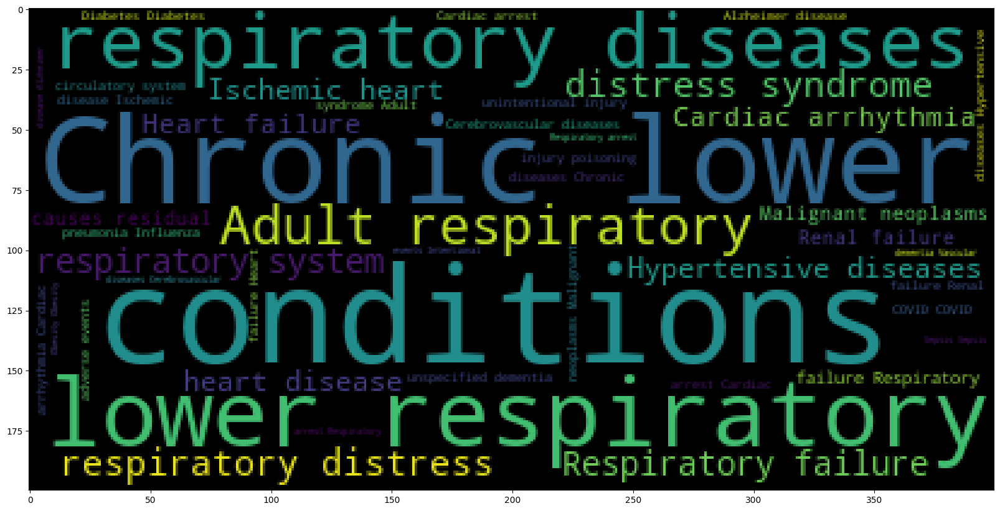

In [67]:
from wordcloud import WordCloud 

sentences = ds3["Condition"].tolist() 
sentences_as_a_string = ' '.join(sentences) 

plt.figure(figsize=(20, 20)) 
plt.imshow(WordCloud().generate(sentences_as_a_string)) 


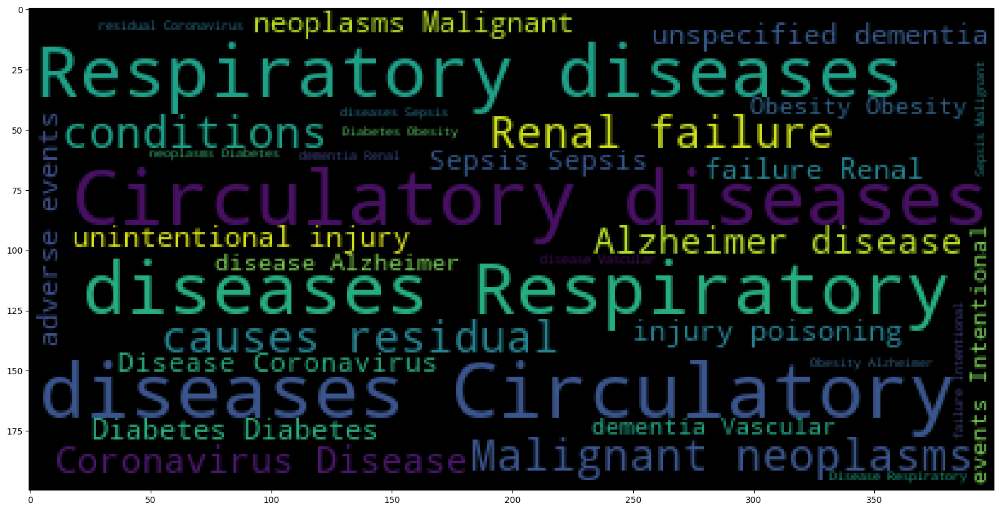

In [68]:
column2_tolist= ds3["Condition Group"].tolist()
column_to_string= " ".join(column2_tolist) 

plt.figure(figsize=(20,20)) 
plt.imshow(WordCloud().generate(column_to_string)) 


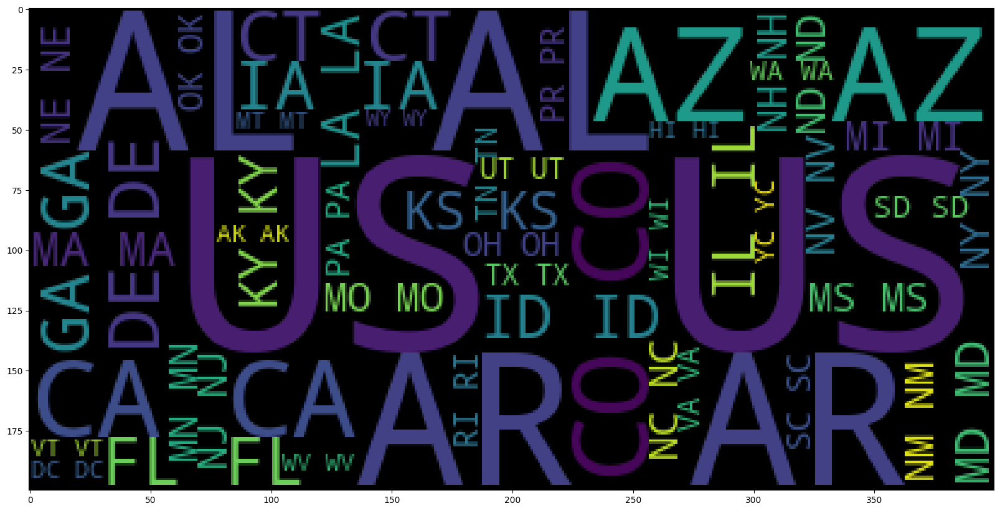

In [72]:
column2_tolist= ds3["State"].tolist() 

# Convert the list to one single string 
column_to_string= " ".join(column2_tolist) 

# Convert the string into WordCloud 
plt.figure(figsize=(20,20)) 
plt.imshow(WordCloud().generate(column_to_string)) 


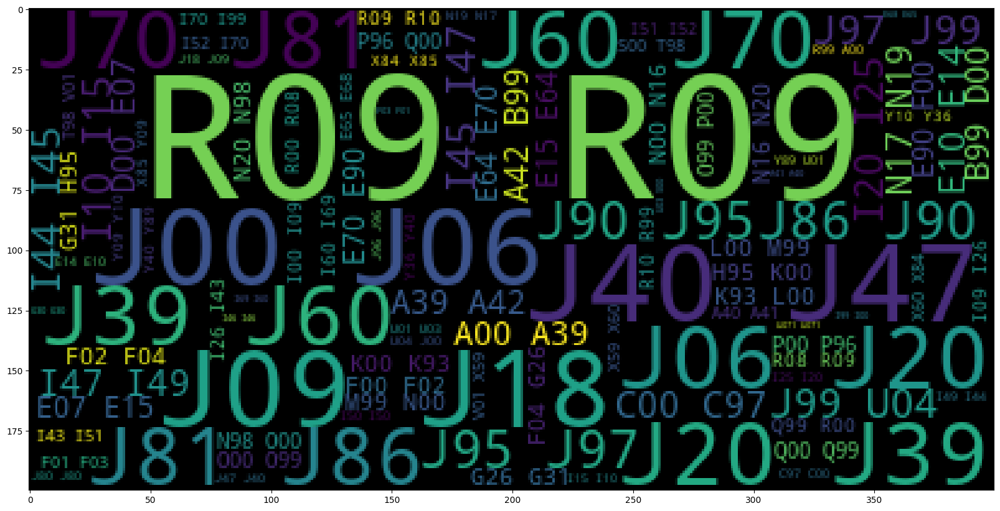

In [75]:
column2_tolist= ds3["ICD10_codes"].tolist() 

# Convert the list to one single string 
column_to_string= " ".join(column2_tolist) 

# Convert the string into WordCloud 
plt.figure(figsize=(20,20)) 
plt.imshow(WordCloud().generate(column_to_string)) 

Conclusion:
The Covid-19 analysis and visualization project using Plotly Express effectively demonstrates the power of visual analytics in understanding and managing the pandemic. Through a variety of high-quality visualizations, including bar charts, line graphs, bubble charts, and scatter plots, the project reveals critical trends and patterns in Covid-19 data. These visual tools enable a clear and comprehensive understanding of the pandemic's dynamics, facilitating data-driven decisions and predictive analysis. The insights gained from this project can assist policymakers, healthcare professionals, and the public in implementing effective interventions and managing health resources to control outbreaks. Overall, Plotly Express proves to be an invaluable tool for conveying complex information and supporting strategic responses to global health crises.